# Buffalo Crime Response Time Prediction

## Importing Libraries and Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

%matplotlib inline

pd.set_option("display.max_rows", None,"display.max_columns", None)
warnings.simplefilter(action='ignore')
plt.style.use('seaborn')

In [2]:
df = pd.read_csv('Dataset/Incidents_and_census_cleaned_data_2.csv')
df.head()

,Incident_month,Incident_day_of_week,Longitude,Latitude,Response_time,incident_datetime,incident_type_primary,zip,created_at,hour_of_day,parent_incident_type,neighborhood,police district,council district,census tract 2010,census block group 2010,census block 2010,Tract Income Level,% Below Poverty Line,2021 Est. Tract Median Family Income,2015 Tract Median Household Income,Tract Population,Tract Minority %,Number of Families,# of House- holds,Non-Hisp White Population,Tract Minority Population,American Indian Pop- ulation,Asian/ Hawaiian/ Pacific Islander Population,Black Pop- ulation,Hispanic Population,Other Population/ Two or More Races,Total Housing Units,1- to 4- Family Units,Median House Age (Years),Owner Occupied Units,Vacant Units,Owner Occupied 1- to 4- Family Units,Renter Occupied Units
0,October,Saturday,42.872,-78.864,37680,10/4/2019 2:40:00 PM,ASSAULT,14204,10/5/2019 1:08:00 AM,14,Assault,Ellicott,District A,FILLMORE,164.0,1,1017,Low,30.11,35387,20938,3046,71.47,719,1405,869,2177,0,140,1391,627,19,1749,1091,76,389,344,389,1016
1,August,Saturday,42.873,-78.868,107340,8/31/2018 5:00:00 PM,ASSAULT,14204,9/1/2018 10:49:00 PM,17,Assault,Ellicott,District A,FILLMORE,164.0,1,1015,Low,30.11,35387,20938,3046,71.47,719,1405,869,2177,0,140,1391,627,19,1749,1091,76,389,344,389,1016
2,February,Friday,42.870,-78.864,23940,2/2/2018 5:00:00 PM,ASSAULT,14204,2/2/2018 11:39:00 PM,17,Assault,First Ward,District A,FILLMORE,5.0,1,1012,Low,37.98,37130,29904,2076,24.42,453,801,1569,507,6,0,0,467,34,1049,1032,76,499,248,499,302
3,May,Friday,42.879,-78.837,19440,5/3/2019 1:30:00 AM,ASSAULT,14206,5/3/2019 6:54:00 AM,1,Assault,Broadway Fillmore,District A,FILLMORE,163.0,1,1001,Low,33.64,35923,26104,2574,26.34,607,1016,1896,678,0,0,270,315,93,1236,1210,76,478,220,478,538
4,December,Monday,42.874,-78.871,26520,12/30/2019 12:17:00 AM,ASSAULT,14204,12/30/2019 7:39:00 AM,0,Assault,Ellicott,District A,FILLMORE,164.0,1,1011,Low,30.11,35387,20938,3046,71.47,719,1405,869,2177,0,140,1391,627,19,1749,1091,76,389,344,389,1016


## Data Understanding

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48704 entries, 0 to 48703
Data columns (total 39 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Incident_month                                48704 non-null  object 
 1   Incident_day_of_week                          48704 non-null  object 
 2   Longitude                                     48704 non-null  float64
 3   Latitude                                      48704 non-null  float64
 4   Response_time                                 48704 non-null  int64  
 5   incident_datetime                             48704 non-null  object 
 6   incident_type_primary                         48704 non-null  object 
 7   zip                                           48704 non-null  int64  
 8   created_at                                    48704 non-null  object 
 9   hour_of_day                                   48704 non-null 

In [4]:
# Dropping created at and incident datetime columns as the target variable(response time) is derived from them

df.drop(columns=['created_at', 'incident_datetime'], inplace=True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48704 entries, 0 to 48703
Data columns (total 37 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Incident_month                                48704 non-null  object 
 1   Incident_day_of_week                          48704 non-null  object 
 2   Longitude                                     48704 non-null  float64
 3   Latitude                                      48704 non-null  float64
 4   Response_time                                 48704 non-null  int64  
 5   incident_type_primary                         48704 non-null  object 
 6   zip                                           48704 non-null  int64  
 7   hour_of_day                                   48704 non-null  int64  
 8   parent_incident_type                          48704 non-null  object 
 9   neighborhood                                  48704 non-null 

In [6]:
df.describe()

,Longitude,Latitude,Response_time,zip,hour_of_day,census tract 2010,census block group 2010,census block 2010,% Below Poverty Line,2021 Est. Tract Median Family Income,2015 Tract Median Household Income,Tract Population,Tract Minority %,Number of Families,# of House- holds,Non-Hisp White Population,Tract Minority Population,American Indian Pop- ulation,Asian/ Hawaiian/ Pacific Islander Population,Black Pop- ulation,Hispanic Population,Other Population/ Two or More Races,Total Housing Units,1- to 4- Family Units,Median House Age (Years),Owner Occupied Units,Vacant Units,Owner Occupied 1- to 4- Family Units,Renter Occupied Units
count,48704.000000,48704.000000,4.870400e+04,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000,48704.000000
mean,42.912105,-78.848090,1.606882e+06,14211.086974,12.324203,59.762311,2.451688,2458.344900,34.094575,44903.034001,31807.412636,3470.421793,61.712662,768.517884,1482.408693,1347.756468,2122.665325,12.662410,155.397277,1477.858677,368.111100,108.635862,1801.003757,1516.186145,74.327981,584.482753,318.595064,575.120237,897.925940
std,0.028284,0.031305,6.996819e+06,5.243142,6.800202,47.077162,1.290538,1288.768388,12.647547,24096.986033,13033.014996,1181.505152,29.481259,304.392676,488.619743,1191.089522,1265.038368,19.397685,248.617704,1265.787583,419.967937,93.694953,528.843715,590.720305,5.651158,284.203002,153.519927,291.241291,333.414146
min,42.828000,-78.912000,0.000000e+00,14201.000000,0.000000,1.100000,1.000000,1000.000000,0.000000,0.000000,0.000000,987.000000,3.550000,0.000000,0.000000,19.000000,134.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,42.894000,-78.877000,1.680150e+04,14207.000000,8.000000,33.010000,1.000000,1012.000000,25.260000,30637.000000,22717.000000,2579.000000,34.090000,533.000000,1109.000000,356.000000,1022.000000,0.000000,0.000000,451.000000,106.000000,40.000000,1376.000000,1182.000000,76.000000,369.000000,211.000000,365.000000,616.000000
50%,42.913000,-78.845000,3.600300e+04,14211.000000,13.000000,47.000000,2.000000,2008.000000,33.640000,37493.000000,28774.000000,3291.000000,71.470000,757.000000,1448.000000,977.000000,2034.000000,1.000000,44.000000,957.000000,205.000000,85.000000,1871.000000,1493.000000,76.000000,542.000000,294.000000,542.000000,895.000000
75%,42.936000,-78.820000,1.110638e+05,14215.000000,18.000000,67.010000,3.000000,3010.000000,43.170000,54244.000000,37644.000000,4344.000000,89.760000,1035.000000,1838.000000,1928.000000,2865.000000,21.000000,171.000000,2419.000000,575.000000,151.000000,2150.000000,1882.000000,76.000000,744.000000,428.000000,744.000000,1140.000000
max,42.965000,-78.799000,1.026841e+08,14225.000000,23.000000,171.000000,7.000000,7005.000000,62.250000,136142.000000,76250.000000,6011.000000,98.970000,1516.000000,2870.000000,4585.000000,5367.000000,91.000000,1195.000000,4852.000000,2172.000000,378.000000,3063.000000,2891.000000,76.000000,1503.000000,822.000000,1503.000000,1912.000000


In [7]:
df.shape

(48704, 37)

### Target Variable Distribution

<AxesSubplot:xlabel='Response_time', ylabel='Density'>

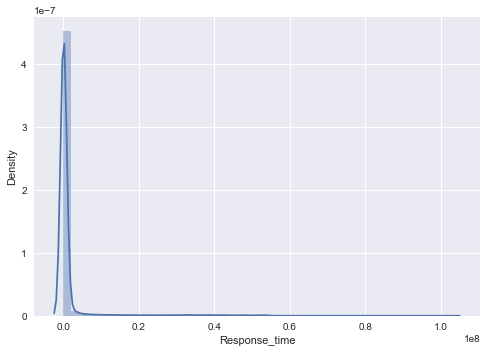

In [8]:
sns.distplot(df['Response_time'])

<AxesSubplot:xlabel='Response_time'>

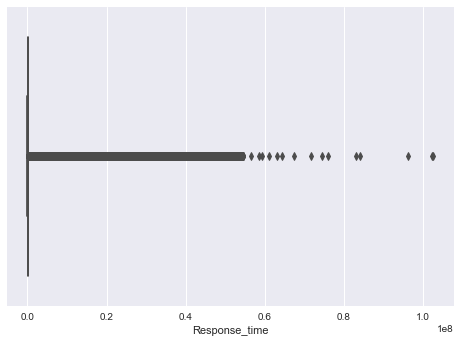

In [9]:
sns.boxplot(df.Response_time)

Dropping the outliers with extreme values. Only considering response minutes under 100,000 which accounts for 95% of the rows.

In [10]:
# New dataset imported after considering 95% of the rows and excluding outliers

df = pd.read_csv('Dataset/incidents_census_data.csv')
df.head()

,Incident_month,Incident_day_of_week,Longitude,Latitude,Response_time,incident_datetime,incident_type_primary,zip,created_at,hour_of_day,parent_incident_type,neighborhood,police district,council district,census tract 2010,census block group 2010,census block 2010,Tract Income Level,% Below Poverty Line,2021 Est. Tract Median Family Income,2015 Tract Median Household Income,Tract Population,Tract Minority %,Number of Families,# of House- holds,Non-Hisp White Population,Tract Minority Population,American Indian Pop- ulation,Asian/ Hawaiian/ Pacific Islander Population,Black Pop- ulation,Hispanic Population,Other Population/ Two or More Races,Total Housing Units,1- to 4- Family Units,Median House Age (Years),Owner Occupied Units,Vacant Units,Owner Occupied 1- to 4- Family Units,Renter Occupied Units
0,October,Saturday,42.872,-78.864,37680,10/4/2019 2:40:00 PM,ASSAULT,14204,10/5/2019 1:08:00 AM,14,Assault,Ellicott,District A,FILLMORE,164.0,1,1017,Low,30.11,35387,20938,3046,71.47,719,1405,869,2177,0,140,1391,627,19,1749,1091,76,389,344,389,1016
1,August,Saturday,42.873,-78.868,107340,8/31/2018 5:00:00 PM,ASSAULT,14204,9/1/2018 10:49:00 PM,17,Assault,Ellicott,District A,FILLMORE,164.0,1,1015,Low,30.11,35387,20938,3046,71.47,719,1405,869,2177,0,140,1391,627,19,1749,1091,76,389,344,389,1016
2,February,Friday,42.870,-78.864,23940,2/2/2018 5:00:00 PM,ASSAULT,14204,2/2/2018 11:39:00 PM,17,Assault,First Ward,District A,FILLMORE,5.0,1,1012,Low,37.98,37130,29904,2076,24.42,453,801,1569,507,6,0,0,467,34,1049,1032,76,499,248,499,302
3,May,Friday,42.879,-78.837,19440,5/3/2019 1:30:00 AM,ASSAULT,14206,5/3/2019 6:54:00 AM,1,Assault,Broadway Fillmore,District A,FILLMORE,163.0,1,1001,Low,33.64,35923,26104,2574,26.34,607,1016,1896,678,0,0,270,315,93,1236,1210,76,478,220,478,538
4,December,Monday,42.874,-78.871,26520,12/30/2019 12:17:00 AM,ASSAULT,14204,12/30/2019 7:39:00 AM,0,Assault,Ellicott,District A,FILLMORE,164.0,1,1011,Low,30.11,35387,20938,3046,71.47,719,1405,869,2177,0,140,1391,627,19,1749,1091,76,389,344,389,1016


<AxesSubplot:xlabel='Response_time'>

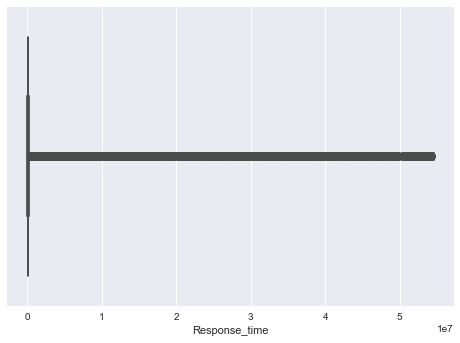

In [11]:
# response time is more consistent now

sns.boxplot(df.Response_time)

In [12]:
# Dropping created at and incident datetime columns as the target variable(response time) is derived from them

df.drop(columns=['created_at', 'incident_datetime'], inplace=True)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48689 entries, 0 to 48688
Data columns (total 37 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Incident_month                                48689 non-null  object 
 1   Incident_day_of_week                          48689 non-null  object 
 2   Longitude                                     48689 non-null  float64
 3   Latitude                                      48689 non-null  float64
 4   Response_time                                 48689 non-null  int64  
 5   incident_type_primary                         48689 non-null  object 
 6   zip                                           48689 non-null  int64  
 7   hour_of_day                                   48689 non-null  int64  
 8   parent_incident_type                          48689 non-null  object 
 9   neighborhood                                  48689 non-null 

## Data Visualization

### Numerical Columns

#### Correlation Heatmap

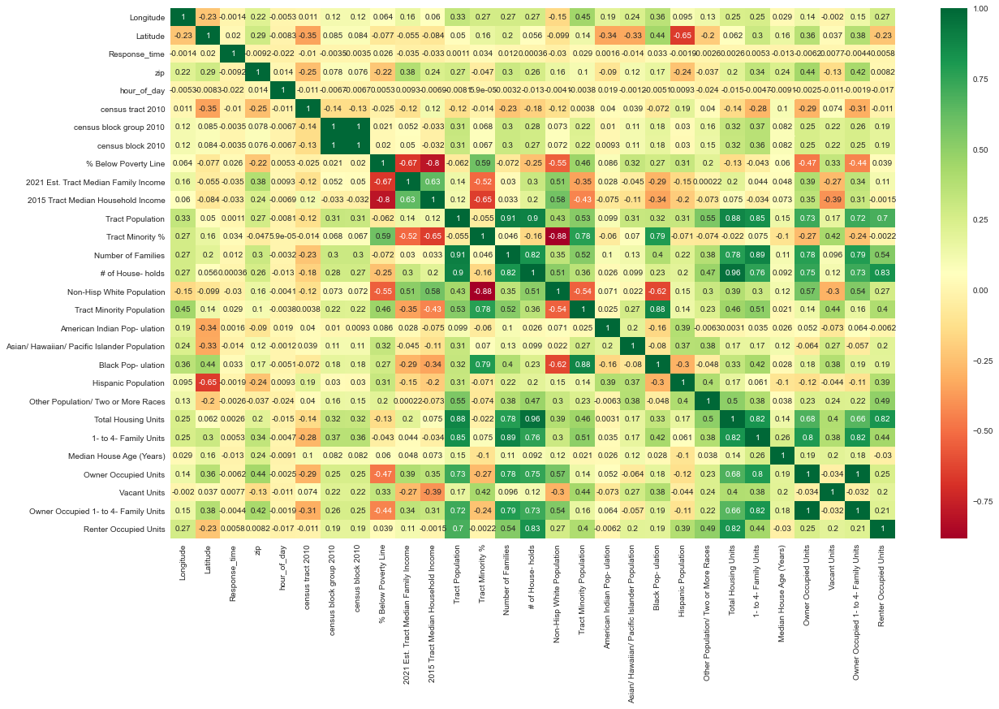

In [14]:
plt.figure(figsize=[20,12])
sns.heatmap(df.corr(), annot=True, cmap='RdYlGn')
plt.show()

<Figure size 1080x576 with 0 Axes>

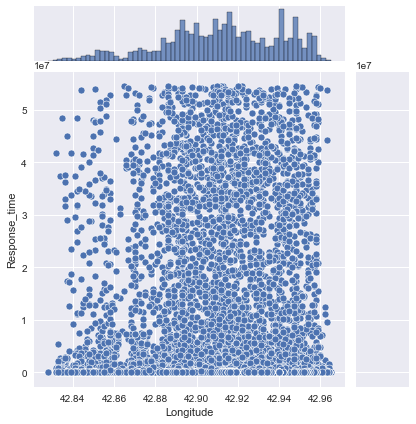

<Figure size 1080x576 with 0 Axes>

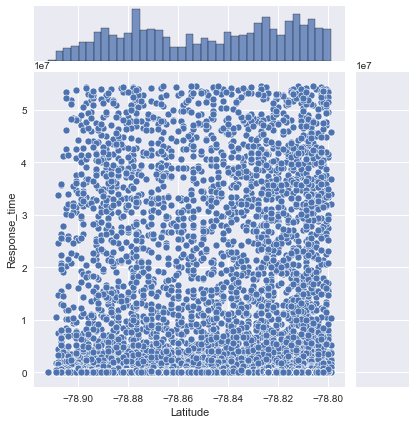

<Figure size 1080x576 with 0 Axes>

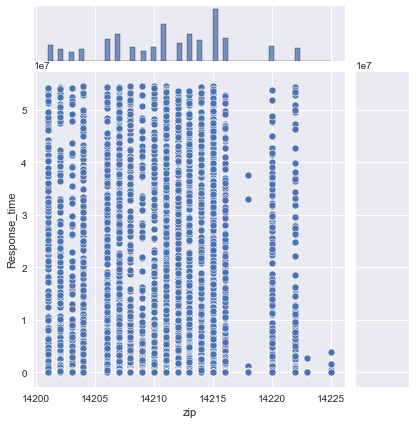

<Figure size 1080x576 with 0 Axes>

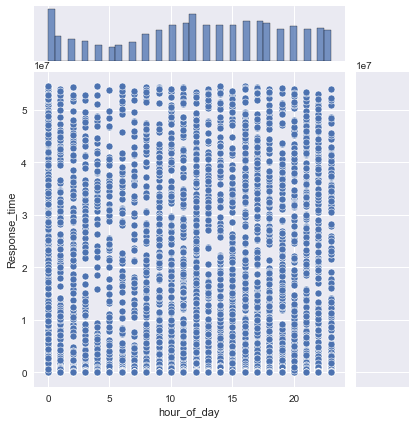

<Figure size 1080x576 with 0 Axes>

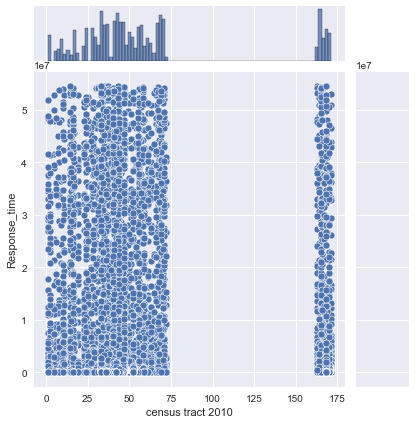

<Figure size 1080x576 with 0 Axes>

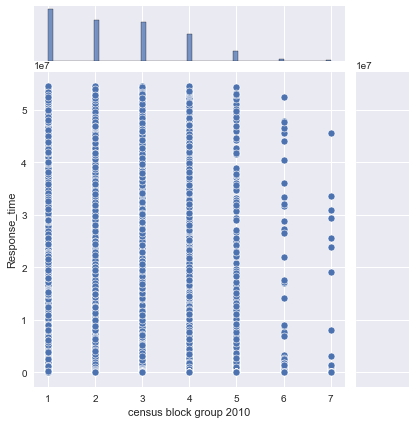

<Figure size 1080x576 with 0 Axes>

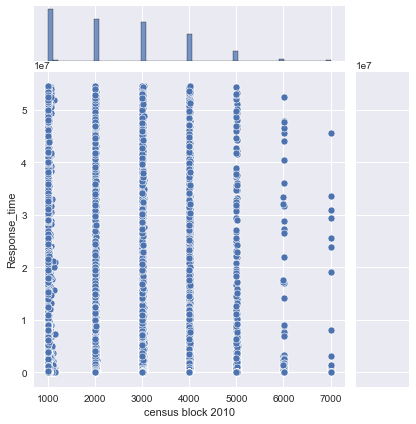

<Figure size 1080x576 with 0 Axes>

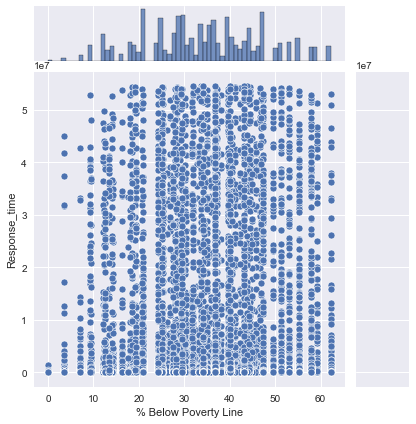

<Figure size 1080x576 with 0 Axes>

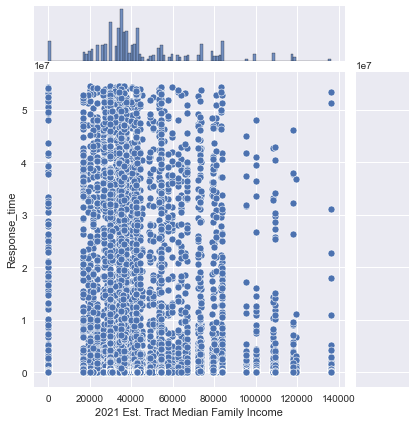

<Figure size 1080x576 with 0 Axes>

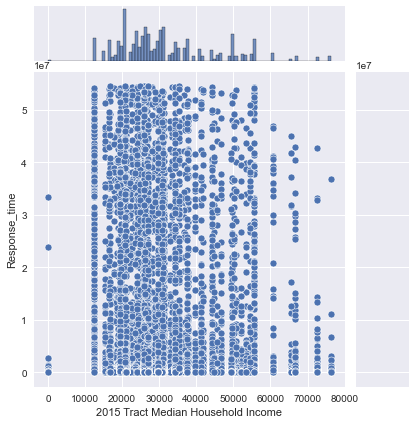

<Figure size 1080x576 with 0 Axes>

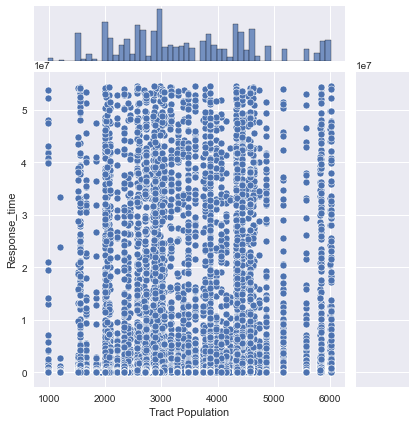

<Figure size 1080x576 with 0 Axes>

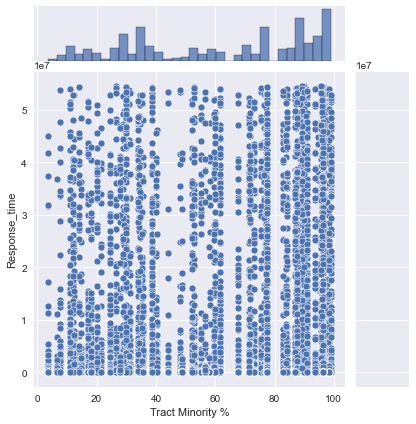

<Figure size 1080x576 with 0 Axes>

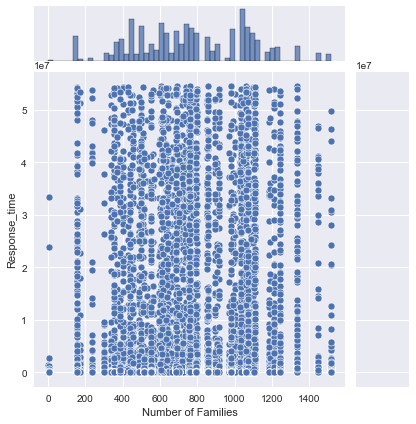

<Figure size 1080x576 with 0 Axes>

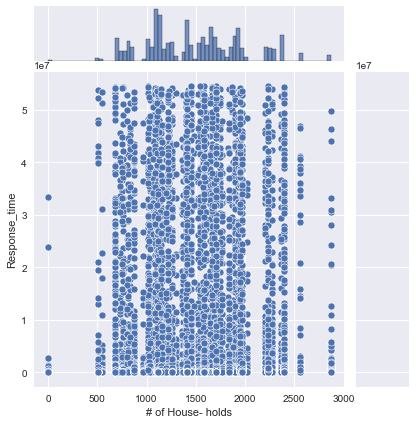

<Figure size 1080x576 with 0 Axes>

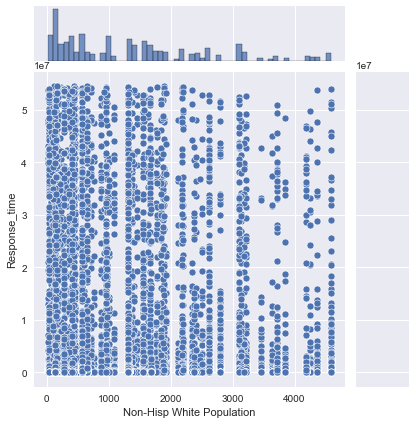

<Figure size 1080x576 with 0 Axes>

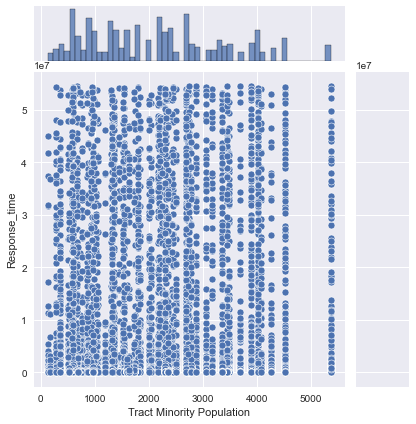

<Figure size 1080x576 with 0 Axes>

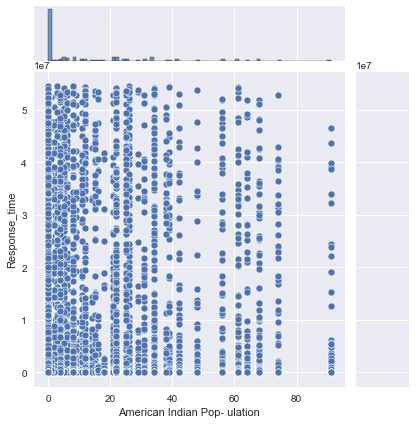

<Figure size 1080x576 with 0 Axes>

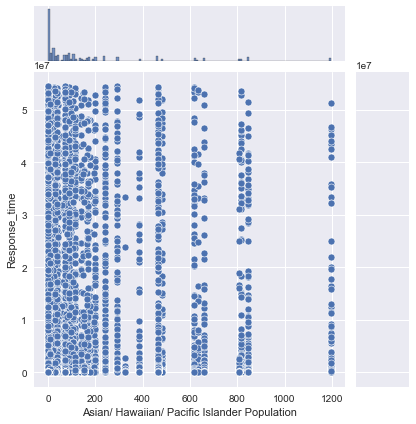

<Figure size 1080x576 with 0 Axes>

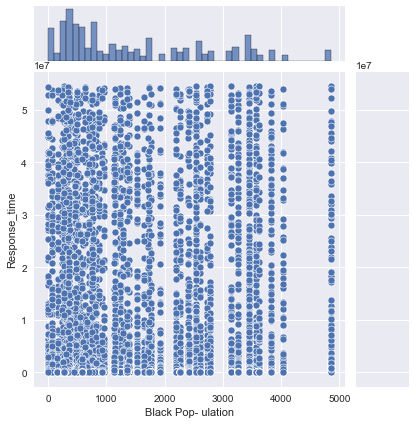

<Figure size 1080x576 with 0 Axes>

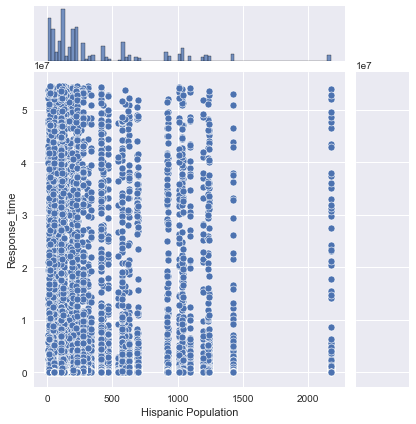

<Figure size 1080x576 with 0 Axes>

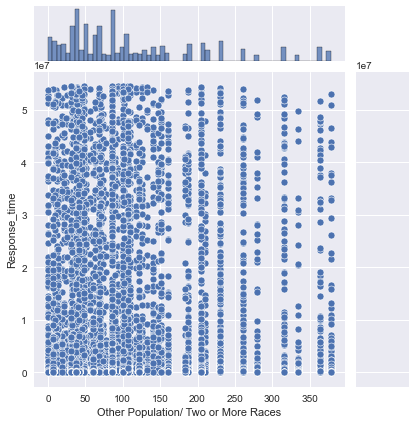

<Figure size 1080x576 with 0 Axes>

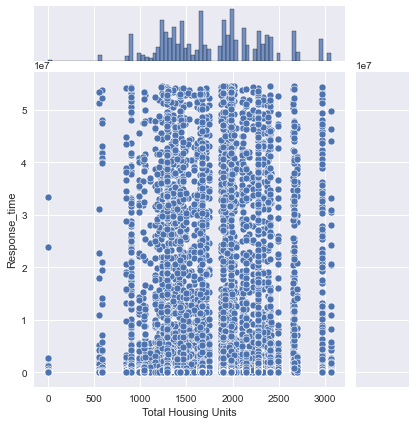

<Figure size 1080x576 with 0 Axes>

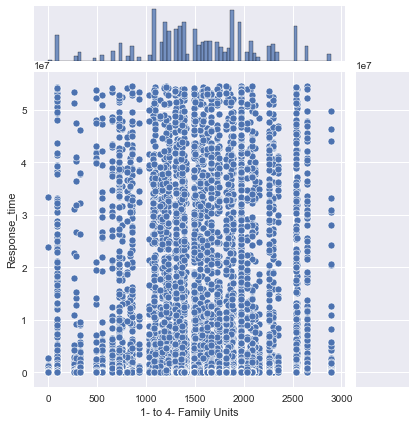

<Figure size 1080x576 with 0 Axes>

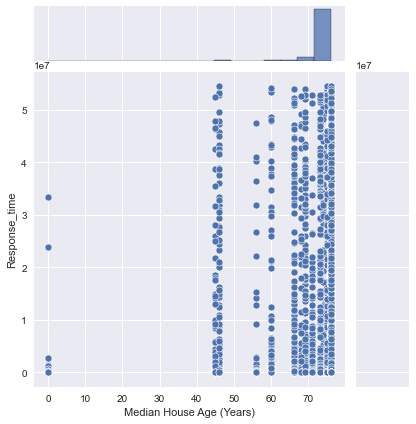

<Figure size 1080x576 with 0 Axes>

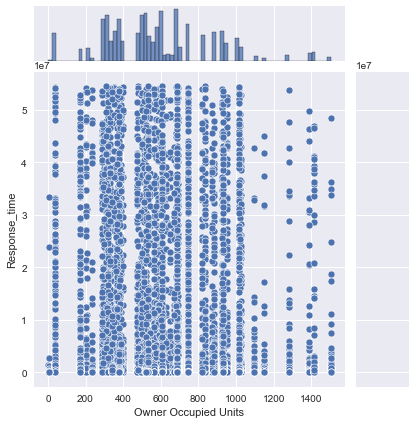

<Figure size 1080x576 with 0 Axes>

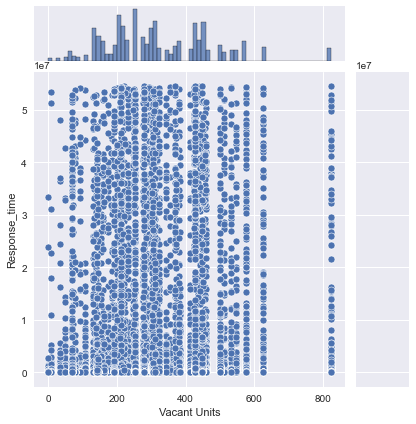

<Figure size 1080x576 with 0 Axes>

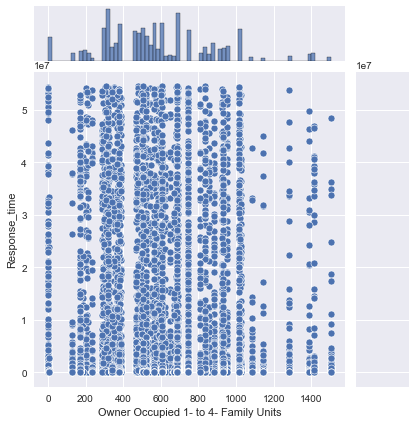

<Figure size 1080x576 with 0 Axes>

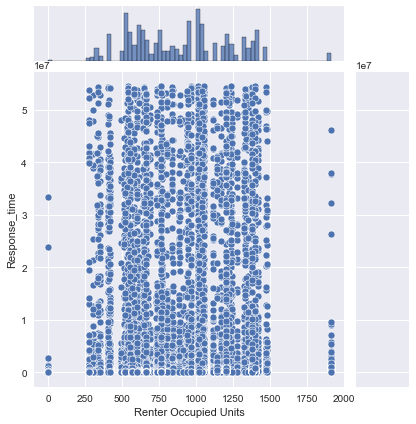

In [15]:
numerical_columns = df.select_dtypes(include=np.number).columns.tolist()

for cols in numerical_columns:
    if cols != 'Response_time':
        plt.figure(figsize=[15,8])
        sns.jointplot(df[cols], df['Response_time'])
        plt.show()

<Figure size 1080x1080 with 0 Axes>

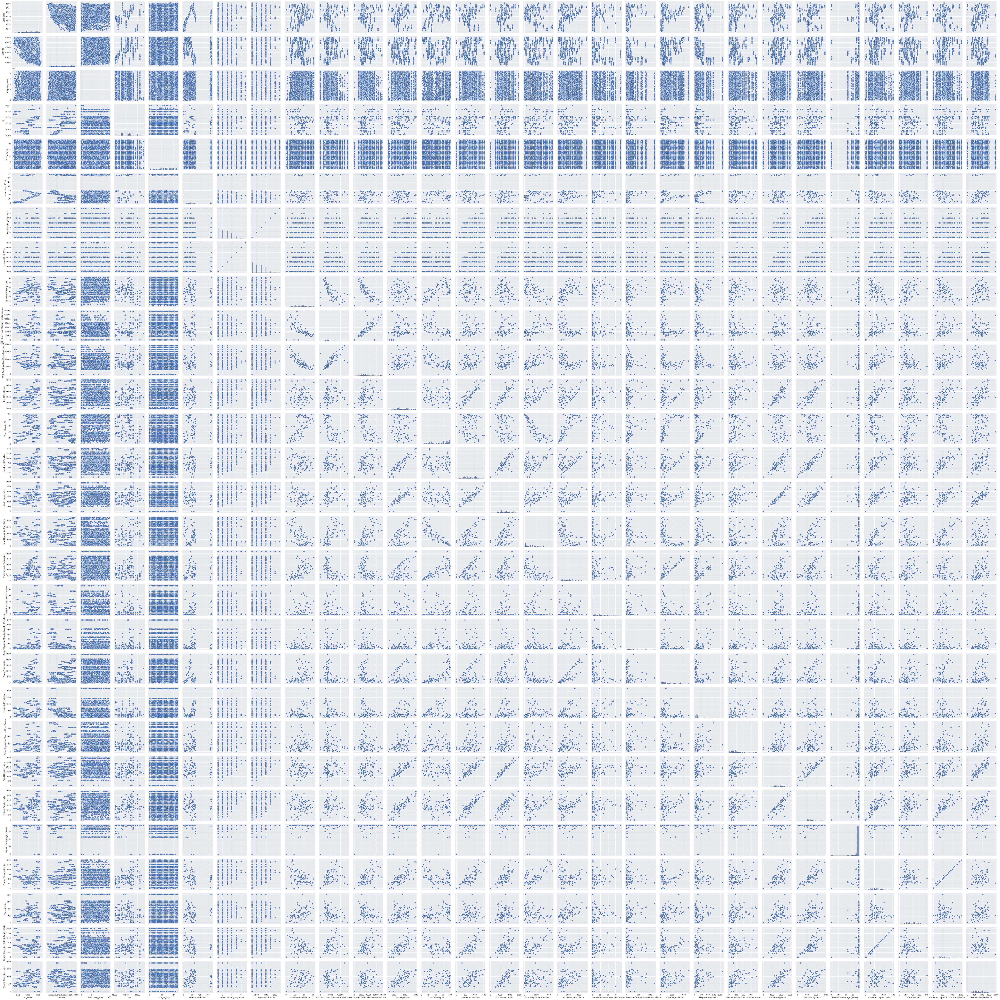

In [16]:
plt.figure(figsize=[15,15])
sns.pairplot(df[numerical_columns])
plt.show()

#### Categorical Columns

In [17]:
categorical_columns=[]

for data in list(df.columns):
    if data not in numerical_columns and data != 'Response_time':
        categorical_columns.append(data)
categorical_columns

['Incident_month',
 'Incident_day_of_week',
 'incident_type_primary',
 'parent_incident_type',
 'neighborhood',
 'police district',
 'council district',
 'Tract Income Level']

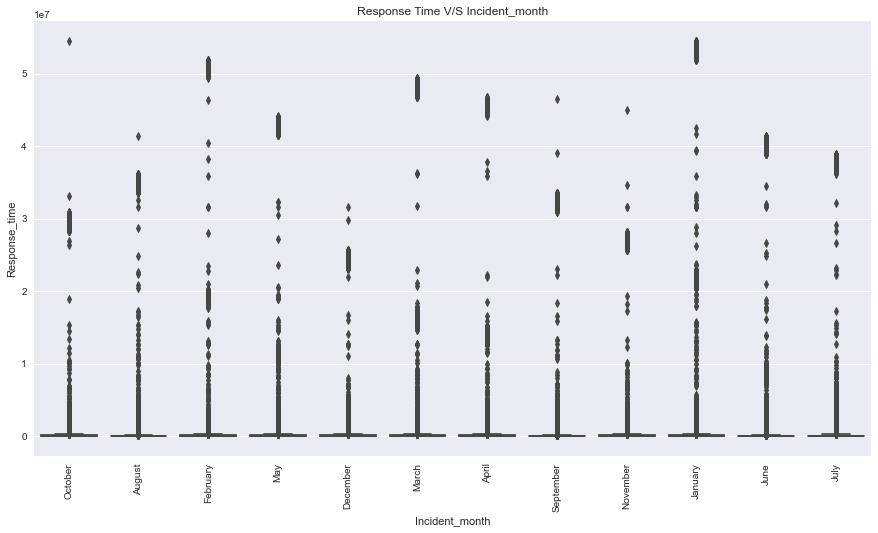

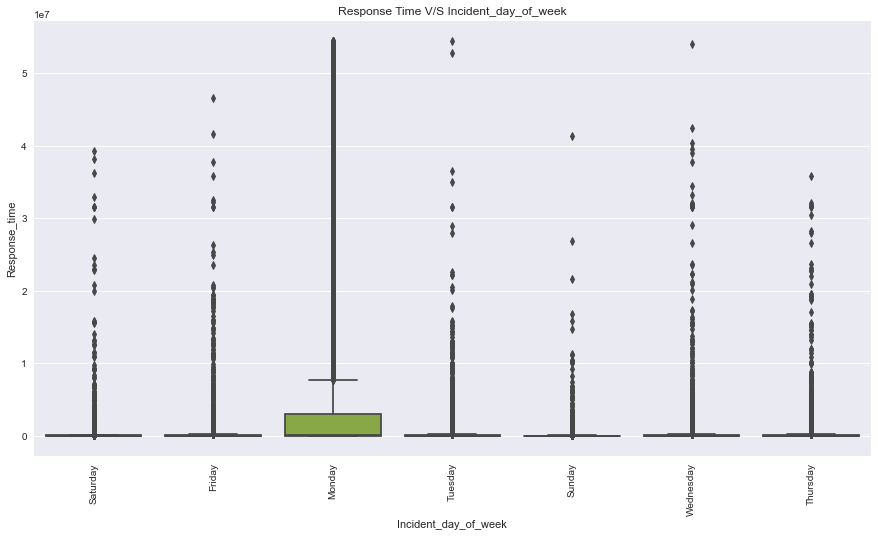

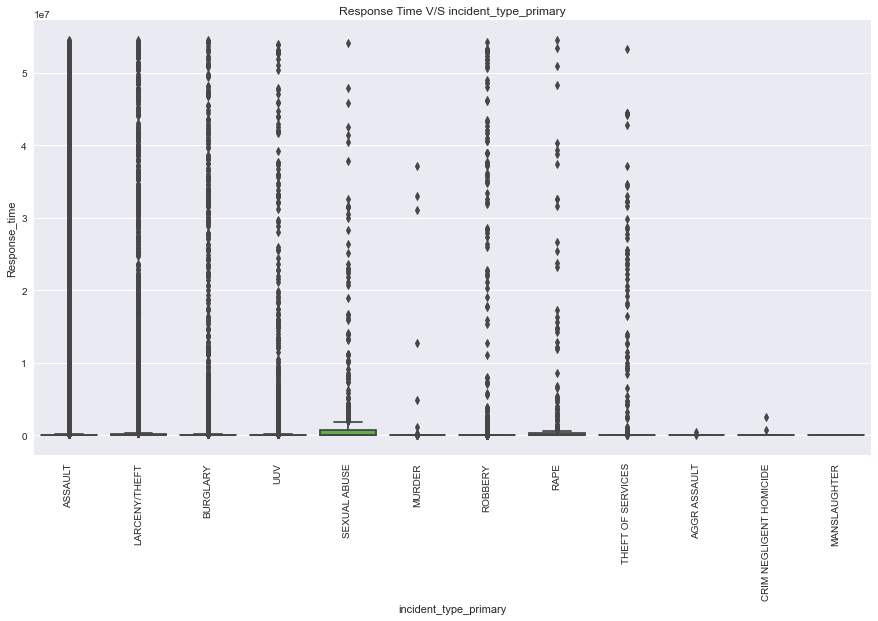

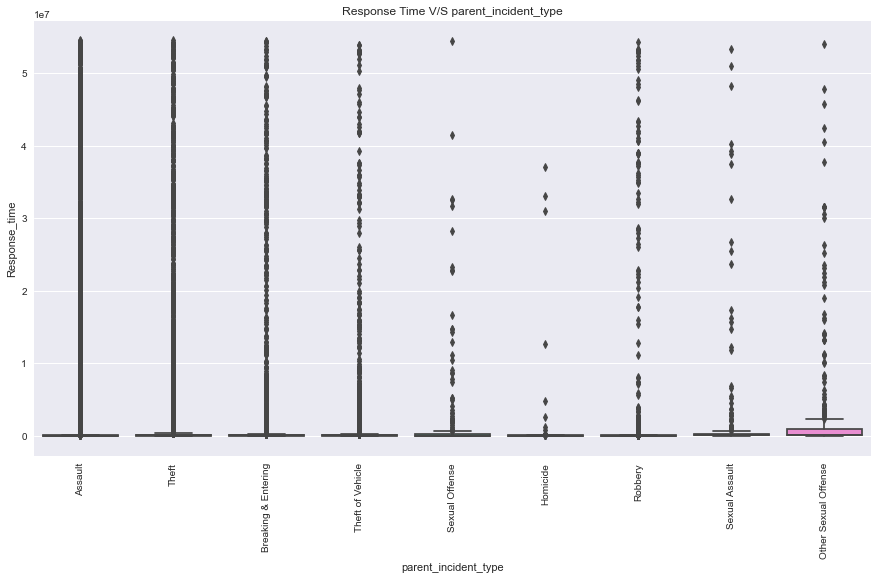

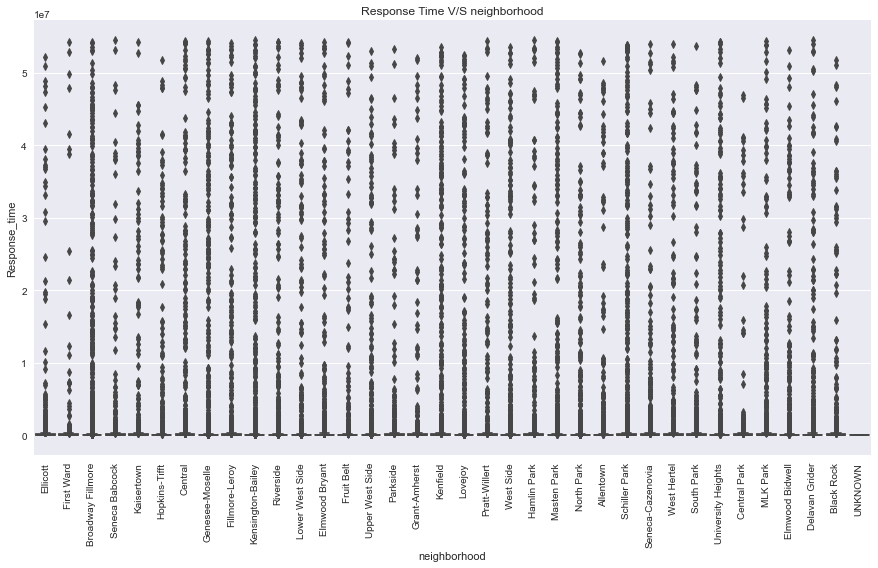

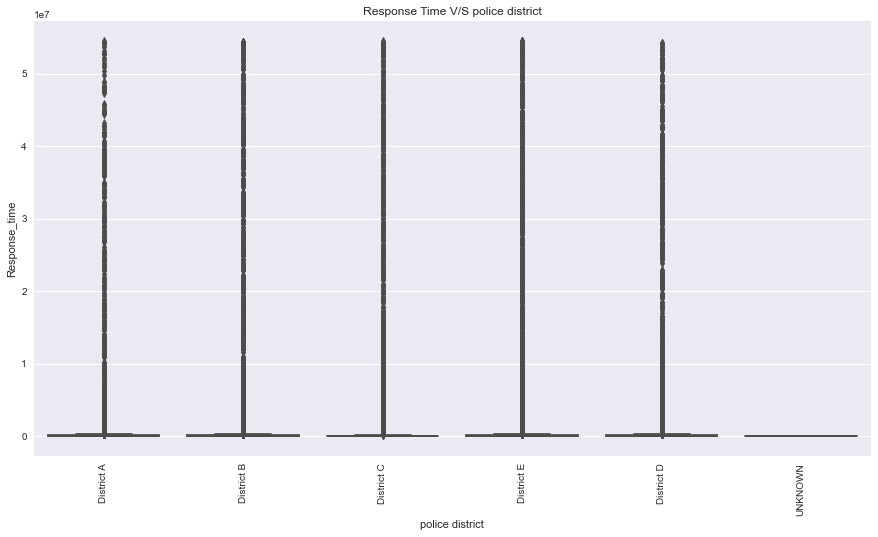

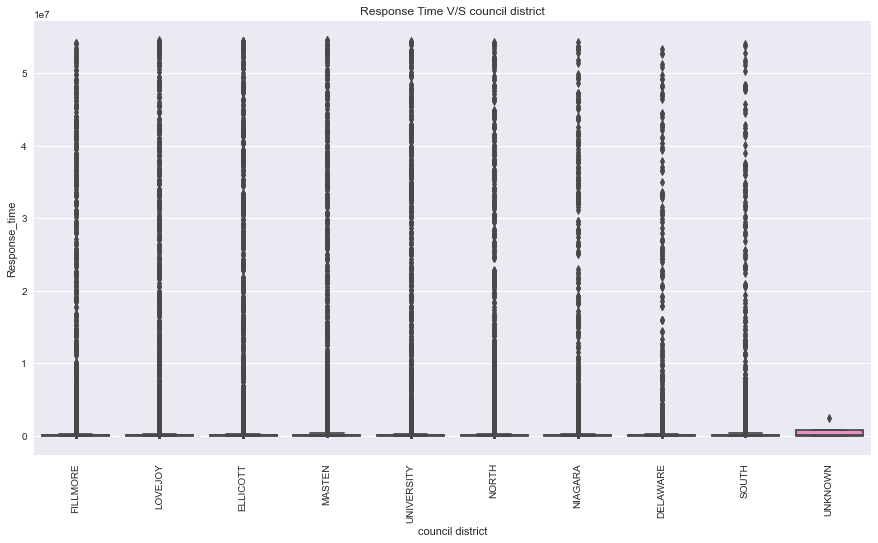

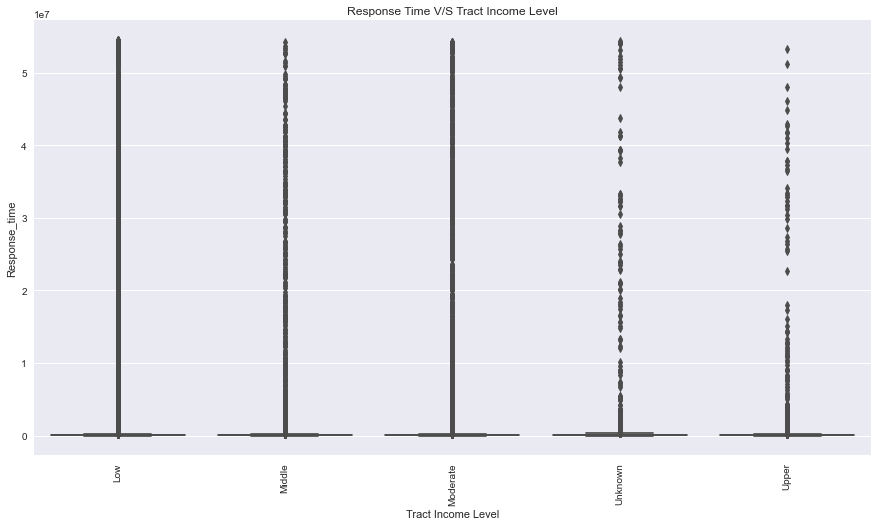

In [18]:
for col in categorical_columns:
    plt.figure(figsize=[15,8])
    plt.title("Response Time V/S {}".format(col), size=12)
    sns.boxplot(df[col], df['Response_time'])
    plt.xticks(rotation=90)
    plt.show()

<AxesSubplot:xlabel='Response_time'>

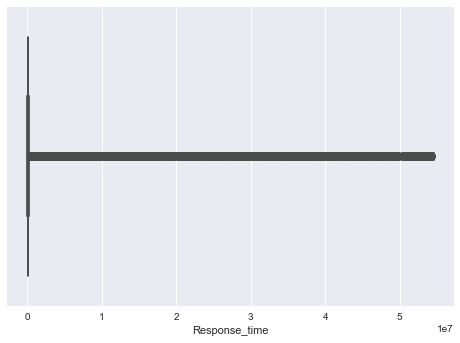

In [19]:
sns.boxplot(df.Response_time)

## Data Preparation

### Dummy Variables

In [20]:
# Creating Dummies
dummy = pd.get_dummies(df[categorical_columns],drop_first=True)

In [21]:
# merging dataframes and dropping dummy columns 
df = pd.concat([df.drop(categorical_columns,axis=1),dummy],axis=1)
df.head()

,Longitude,Latitude,Response_time,zip,hour_of_day,census tract 2010,census block group 2010,census block 2010,% Below Poverty Line,2021 Est. Tract Median Family Income,2015 Tract Median Household Income,Tract Population,Tract Minority %,Number of Families,# of House- holds,Non-Hisp White Population,Tract Minority Population,American Indian Pop- ulation,Asian/ Hawaiian/ Pacific Islander Population,Black Pop- ulation,Hispanic Population,Other Population/ Two or More Races,Total Housing Units,1- to 4- Family Units,Median House Age (Years),Owner Occupied Units,Vacant Units,Owner Occupied 1- to 4- Family Units,Renter Occupied Units,Incident_month_August,Incident_month_December,Incident_month_February,Incident_month_January,Incident_month_July,Incident_month_June,Incident_month_March,Incident_month_May,Incident_month_November,Incident_month_October,Incident_month_September,Incident_day_of_week_Monday,Incident_day_of_week_Saturday,Incident_day_of_week_Sunday,Incident_day_of_week_Thursday,Incident_day_of_week_Tuesday,Incident_day_of_week_Wednesday,incident_type_primary_ASSAULT,incident_type_primary_BURGLARY,incident_type_primary_CRIM NEGLIGENT HOMICIDE,incident_type_primary_LARCENY/THEFT,incident_type_primary_MANSLAUGHTER,incident_type_primary_MURDER,incident_type_primary_RAPE,incident_type_primary_ROBBERY,incident_type_primary_SEXUAL ABUSE,incident_type_primary_THEFT OF SERVICES,incident_type_primary_UUV,parent_incident_type_Breaking & Entering,parent_incident_type_Homicide,parent_incident_type_Other Sexual Offense,parent_incident_type_Robbery,parent_incident_type_Sexual Assault,parent_incident_type_Sexual Offense,parent_incident_type_Theft,parent_incident_type_Theft of Vehicle,neighborhood_Black Rock,neighborhood_Broadway Fillmore,neighborhood_Central,neighborhood_Central Park,neighborhood_Delavan Grider,neighborhood_Ellicott,neighborhood_Elmwood Bidwell,neighborhood_Elmwood Bryant,neighborhood_Fillmore-Leroy,neighborhood_First Ward,neighborhood_Fruit Belt,neighborhood_Genesee-Moselle,neighborhood_Grant-Amherst,neighborhood_Hamlin Park,neighborhood_Hopkins-Tifft,neighborhood_Kaisertown,neighborhood_Kenfield,neighborhood_Kensington-Bailey,neighborhood_Lovejoy,neighborhood_Lower West Side,neighborhood_MLK Park,neighborhood_Masten Park,neighborhood_North Park,neighborhood_Parkside,neighborhood_Pratt-Willert,neighborhood_Riverside,neighborhood_Schiller Park,neighborhood_Seneca Babcock,neighborhood_Seneca-Cazenovia,neighborhood_South Park,neighborhood_UNKNOWN,neighborhood_University Heights,neighborhood_Upper West Side,neighborhood_West Hertel,neighborhood_West Side,police district_District B,police district_District C,police district_District D,police district_District E,police district_UNKNOWN,council district_ELLICOTT,council district_FILLMORE,council district_LOVEJOY,council district_MASTEN,council district_NIAGARA,council district_NORTH,council district_SOUTH,council district_UNIVERSITY,council district_UNKNOWN,Tract Income Level_Middle,Tract Income Level_Moderate,Tract Income Level_Unknown,Tract Income Level_Upper
0,42.872,-78.864,37680,14204,14,164.0,1,1017,30.11,35387,20938,3046,71.47,719,1405,869,2177,0,140,1391,627,19,1749,1091,76,389,344,389,1016,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,42.873,-78.868,107340,14204,17,164.0,1,1015,30.11,35387,20938,3046,71.47,719,1405,869,2177,0,140,1391,627,19,1749,1091,76,389,344,389,1016,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,42.870,-78.864,23940,14204,17,5.0,1,1012,37.98,37130,29904,2076,24.42,453,801,1569,507,6,0,0,467,34,1049,1032,76,499,248,499,302,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0

In [22]:
df.shape

(48689, 118)

### Train-Test split

Using 70:30 split on our training dataset

In [23]:
from sklearn.model_selection import train_test_split

X = df.drop('Response_time',axis=1)
y = df['Response_time']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.30, random_state=0)

In [24]:
print('X_train: ', X_train.shape)
print('X_val: ', X_val.shape)
print('y_train: ', y_train.shape)
print('y_val: ', y_val.shape)

X_train:  (34082, 117)
X_val:  (14607, 117)
y_train:  (34082,)
y_val:  (14607,)


### Scaling Numerical Data

In [25]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)

print(X_train_scaled.shape)
X_train_scaled.head()

(34082, 117)


,Longitude,Latitude,zip,hour_of_day,census tract 2010,census block group 2010,census block 2010,% Below Poverty Line,2021 Est. Tract Median Family Income,2015 Tract Median Household Income,Tract Population,Tract Minority %,Number of Families,# of House- holds,Non-Hisp White Population,Tract Minority Population,American Indian Pop- ulation,Asian/ Hawaiian/ Pacific Islander Population,Black Pop- ulation,Hispanic Population,Other Population/ Two or More Races,Total Housing Units,1- to 4- Family Units,Median House Age (Years),Owner Occupied Units,Vacant Units,Owner Occupied 1- to 4- Family Units,Renter Occupied Units,Incident_month_August,Incident_month_December,Incident_month_February,Incident_month_January,Incident_month_July,Incident_month_June,Incident_month_March,Incident_month_May,Incident_month_November,Incident_month_October,Incident_month_September,Incident_day_of_week_Monday,Incident_day_of_week_Saturday,Incident_day_of_week_Sunday,Incident_day_of_week_Thursday,Incident_day_of_week_Tuesday,Incident_day_of_week_Wednesday,incident_type_primary_ASSAULT,incident_type_primary_BURGLARY,incident_type_primary_CRIM NEGLIGENT HOMICIDE,incident_type_primary_LARCENY/THEFT,incident_type_primary_MANSLAUGHTER,incident_type_primary_MURDER,incident_type_primary_RAPE,incident_type_primary_ROBBERY,incident_type_primary_SEXUAL ABUSE,incident_type_primary_THEFT OF SERVICES,incident_type_primary_UUV,parent_incident_type_Breaking & Entering,parent_incident_type_Homicide,parent_incident_type_Other Sexual Offense,parent_incident_type_Robbery,parent_incident_type_Sexual Assault,parent_incident_type_Sexual Offense,parent_incident_type_Theft,parent_incident_type_Theft of Vehicle,neighborhood_Black Rock,neighborhood_Broadway Fillmore,neighborhood_Central,neighborhood_Central Park,neighborhood_Delavan Grider,neighborhood_Ellicott,neighborhood_Elmwood Bidwell,neighborhood_Elmwood Bryant,neighborhood_Fillmore-Leroy,neighborhood_First Ward,neighborhood_Fruit Belt,neighborhood_Genesee-Moselle,neighborhood_Grant-Amherst,neighborhood_Hamlin Park,neighborhood_Hopkins-Tifft,neighborhood_Kaisertown,neighborhood_Kenfield,neighborhood_Kensington-Bailey,neighborhood_Lovejoy,neighborhood_Lower West Side,neighborhood_MLK Park,neighborhood_Masten Park,neighborhood_North Park,neighborhood_Parkside,neighborhood_Pratt-Willert,neighborhood_Riverside,neighborhood_Schiller Park,neighborhood_Seneca Babcock,neighborhood_Seneca-Cazenovia,neighborhood_South Park,neighborhood_UNKNOWN,neighborhood_University Heights,neighborhood_Upper West Side,neighborhood_West Hertel,neighborhood_West Side,police district_District B,police district_District C,police district_District D,police district_District E,police district_UNKNOWN,council district_ELLICOTT,council district_FILLMORE,council district_LOVEJOY,council district_MASTEN,council district_NIAGARA,council district_NORTH,council district_SOUTH,council district_UNIVERSITY,council district_UNKNOWN,Tract Income Level_Middle,Tract Income Level_Moderate,Tract Income Level_Unknown,Tract Income Level_Upper
0,0.669118,0.929204,0.583333,0.826087,0.211301,0.000000,0.000167,0.693494,0.249783,0.338007,0.666600,0.905366,0.699868,0.593031,0.091327,0.719664,0.285714,0.060251,0.737222,0.054940,0.264550,0.646752,0.683155,1.000000,0.455755,0.339416,0.455755,0.531904,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.529412,0.451327,0.125000,1.000000,0.175986,0.333333,0.334555,0.405783,0.295566,0.367751,0.210191,0.890275,0.265172,0.264111,0.047306,0.319893,0.087912,0.000000,0.358203,0.007849,0.103175,0.421156,0.408855,1.000000,0.232868,0.647202,0.232868,0.213389,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

### Train data

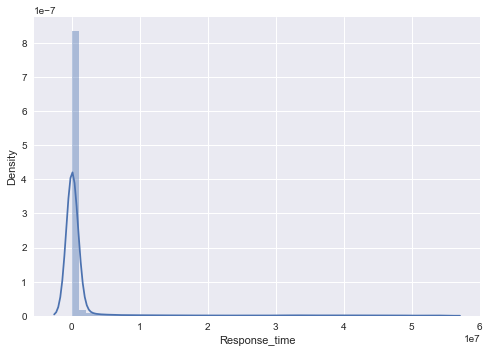

In [26]:
sns.distplot(y_train)
plt.show()

### Validation Data

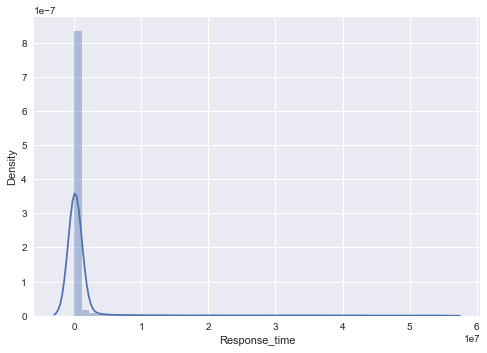

In [27]:
sns.distplot(y_val)
plt.show()

## Feature Selection and Model Building

### 1. Using All features at once

In [28]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [29]:
# building model with statsmodels OLS
X_train_const = sm.add_constant(X_train_scaled)
y_train = y_train.values.reshape(-1,1)
lr_1 = sm.OLS(y_train, X_train_const).fit()
print(lr_1.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.173
Model:                            OLS   Adj. R-squared:                  0.170
Method:                 Least Squares   F-statistic:                     66.22
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:16   Log-Likelihood:            -5.8174e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   33974   BIC:                         1.165e+06
Df Model:                         107                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [30]:
# predict training target variable
y_pred_train = lr_1.predict(X_train_const)

In [31]:
# add constant on test data for sm OLS 
X_val_const = sm.add_constant(X_val)

# predict on test data using previous model
y_pred = lr_1.predict(X_val_const)

### 2. Top 15 features using Recursive Feature Selection

In [32]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE

# Selecting Top15 columns
lr = LinearRegression()
rfe = RFE(lr, 15)
rfe = rfe.fit(X_train_scaled, y_train)

In [33]:
pd.DataFrame(zip(X_train_scaled.columns, rfe.ranking_),columns=["Columns","Ranking"])

,Columns,Ranking
0,Longitude,66
1,Latitude,8
2,zip,33
3,hour_of_day,13
4,census tract 2010,85
5,census block group 2010,1
6,census block 2010,1
7,% Below Poverty Line,14
8,2021 Est. Tract Median Family Income,1
9,2015 Tract Median Household Income,9


In [34]:
col_15 = X_train_scaled.columns[rfe.support_]
pd.DataFrame(col_15)

,0
0,census block group 2010
1,census block 2010
2,2021 Est. Tract Median Family Income
3,Tract Population
4,Incident_month_January
5,Incident_day_of_week_Monday
6,incident_type_primary_ASSAULT
7,incident_type_primary_LARCENY/THEFT
8,incident_type_primary_RAPE
9,incident_type_primary_THEFT OF SERVICES


In [35]:
# X_train prepared with the top selected features
X_train_rfe = X_train[col_15]
X_train_rfe.head()

,census block group 2010,census block 2010,2021 Est. Tract Median Family Income,Tract Population,Incident_month_January,Incident_day_of_week_Monday,incident_type_primary_ASSAULT,incident_type_primary_LARCENY/THEFT,incident_type_primary_RAPE,incident_type_primary_THEFT OF SERVICES,parent_incident_type_Other Sexual Offense,parent_incident_type_Theft,neighborhood_UNKNOWN,neighborhood_Upper West Side,council district_UNKNOWN
18138,1,1001,34006,4336,0,0,0,0,0,0,0,0,0,0,0
5265,3,3009,40239,2043,0,0,0,0,0,0,0,0,0,0,0
43644,3,3004,59814,2072,0,0,0,1,0,0,0,1,0,0,0
34532,1,1000,72178,4539,0,1,0,1,0,0,0,1,0,0,0
20856,1,1022,48437,1832,1,0,0,1,0,0,0,1,0,0,0


In [36]:
# add constant on train data
X_train_new = sm.add_constant(X_train_rfe)

# fit model with train data
lr_2 = sm.OLS(y_train, X_train_new).fit()
print(lr_2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     490.0
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:19   Log-Likelihood:            -5.8184e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34067   BIC:                         1.164e+06
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [37]:
# predict training target variable
y_pred_train = lr_2.predict(X_train_new)

In [38]:
# select top 15 features for test data
X_val_rfe = X_val[col_15]

# add constant on test data
X_val_const = sm.add_constant(X_val_rfe)

# predict test target variable
y_pred = lr_2.predict(X_val_const)

In [39]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def vif(X_data):
    vif = pd.DataFrame()
    X = X_data
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'],2)
    vif = vif.sort_values(by = 'VIF', ascending=False)
    vif.reset_index(inplace=True, drop=True)
    return vif

In [40]:
# checking mulitcollinearity of the model obtained from automatic selection technique with 15 features
vif(X_train_rfe)

,Features,VIF
0,incident_type_primary_LARCENY/THEFT,inf
1,incident_type_primary_THEFT OF SERVICES,inf
2,parent_incident_type_Theft,inf
3,census block 2010,55855.93
4,census block group 2010,55708.03
5,Tract Population,7.84
6,2021 Est. Tract Median Family Income,4.21
7,incident_type_primary_ASSAULT,1.59
8,Incident_day_of_week_Monday,1.22
9,neighborhood_Upper West Side,1.14


### Dropping features with VIF > 2 and P-value > 0.05 while keeping a track of Adjusted R-squared score.

VIF tells us the multicollinear features with value greater than 2 that are no good for our model. Whereas, P-value comments on the statistical significance of the feature in the model.

In [41]:
X_train_rfe = X_train_rfe.drop(['incident_type_primary_LARCENY/THEFT'], axis=1)

# add const on transformed X_train dataset
X_train_new = sm.add_constant(X_train_rfe)

# fit model on training data
lr = sm.OLS(y_train, X_train_new).fit()
print(lr.summary())
vif(X_train_rfe)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     490.0
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:19   Log-Likelihood:            -5.8184e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34067   BIC:                         1.164e+06
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,census block 2010,55855.93
1,census block group 2010,55708.03
2,Tract Population,7.84
3,2021 Est. Tract Median Family Income,4.21
4,parent_incident_type_Theft,2.29
5,incident_type_primary_ASSAULT,1.59
6,Incident_day_of_week_Monday,1.22
7,neighborhood_Upper West Side,1.14
8,Incident_month_January,1.09
9,incident_type_primary_RAPE,1.02


In [42]:
X_train_rfe = X_train_rfe.drop(['parent_incident_type_Theft'], axis=1)

# add const on transformed X_train dataset
X_train_new = sm.add_constant(X_train_rfe)

# fit model on training data
lr = sm.OLS(y_train, X_train_new).fit()
print(lr.summary())
vif(X_train_rfe)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     527.7
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:19   Log-Likelihood:            -5.8184e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34068   BIC:                         1.164e+06
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,census block 2010,53317.03
1,census block group 2010,53193.09
2,Tract Population,7.50
3,2021 Est. Tract Median Family Income,4.00
4,incident_type_primary_ASSAULT,1.28
5,Incident_day_of_week_Monday,1.22
6,neighborhood_Upper West Side,1.13
7,Incident_month_January,1.09
8,incident_type_primary_RAPE,1.01
9,incident_type_primary_THEFT OF SERVICES,1.01


In [43]:
X_train_rfe = X_train_rfe.drop(['census block 2010'], axis=1)

# add const on transformed X_train dataset
X_train_new = sm.add_constant(X_train_rfe)

# fit model on training data
lr = sm.OLS(y_train, X_train_new).fit()
print(lr.summary())
vif(X_train_rfe)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     571.6
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:19   Log-Likelihood:            -5.8184e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34069   BIC:                         1.164e+06
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,Tract Population,7.41
1,census block group 2010,4.77
2,2021 Est. Tract Median Family Income,3.99
3,incident_type_primary_ASSAULT,1.28
4,Incident_day_of_week_Monday,1.22
5,neighborhood_Upper West Side,1.13
6,Incident_month_January,1.08
7,incident_type_primary_RAPE,1.01
8,incident_type_primary_THEFT OF SERVICES,1.01
9,parent_incident_type_Other Sexual Offense,1.01


In [44]:
X_train_rfe = X_train_rfe.drop(['census block group 2010'], axis=1)

# add const on transformed X_train dataset
X_train_new = sm.add_constant(X_train_rfe)

# fit model on training data
lr = sm.OLS(y_train, X_train_new).fit()
print(lr.summary())
vif(X_train_rfe)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     623.6
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:20   Log-Likelihood:            -5.8184e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34070   BIC:                         1.164e+06
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,Tract Population,4.64
1,2021 Est. Tract Median Family Income,3.93
2,incident_type_primary_ASSAULT,1.27
3,Incident_day_of_week_Monday,1.22
4,neighborhood_Upper West Side,1.13
5,Incident_month_January,1.08
6,incident_type_primary_RAPE,1.01
7,incident_type_primary_THEFT OF SERVICES,1.01
8,parent_incident_type_Other Sexual Offense,1.01
9,neighborhood_UNKNOWN,1.00


In [45]:
X_train_rfe = X_train_rfe.drop(['neighborhood_UNKNOWN'], axis=1)

# add const on transformed X_train dataset
X_train_new = sm.add_constant(X_train_rfe)

# fit model on training data
lr = sm.OLS(y_train, X_train_new).fit()
print(lr.summary())
vif(X_train_rfe)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     686.0
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:20   Log-Likelihood:            -5.8184e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34071   BIC:                         1.164e+06
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,Tract Population,4.64
1,2021 Est. Tract Median Family Income,3.93
2,incident_type_primary_ASSAULT,1.27
3,Incident_day_of_week_Monday,1.22
4,neighborhood_Upper West Side,1.13
5,Incident_month_January,1.08
6,incident_type_primary_RAPE,1.01
7,incident_type_primary_THEFT OF SERVICES,1.01
8,parent_incident_type_Other Sexual Offense,1.01
9,council district_UNKNOWN,1.00


In [46]:
X_train_rfe = X_train_rfe.drop(['council district_UNKNOWN'], axis=1)

# add const on transformed X_train dataset
X_train_new = sm.add_constant(X_train_rfe)

# fit model on training data
lr = sm.OLS(y_train, X_train_new).fit()
print(lr.summary())
vif(X_train_rfe)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     762.2
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:20   Log-Likelihood:            -5.8184e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34072   BIC:                         1.164e+06
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,Tract Population,4.64
1,2021 Est. Tract Median Family Income,3.93
2,incident_type_primary_ASSAULT,1.27
3,Incident_day_of_week_Monday,1.22
4,neighborhood_Upper West Side,1.13
5,Incident_month_January,1.08
6,incident_type_primary_RAPE,1.01
7,incident_type_primary_THEFT OF SERVICES,1.01
8,parent_incident_type_Other Sexual Offense,1.01


In [47]:
X_train_rfe = X_train_rfe.drop(['Tract Population'], axis=1)

# add const on transformed X_train dataset
X_train_new = sm.add_constant(X_train_rfe)

# fit model on training data
lr = sm.OLS(y_train, X_train_new).fit()
print(lr.summary())
vif(X_train_rfe)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     856.3
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:20   Log-Likelihood:            -5.8185e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34073   BIC:                         1.164e+06
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,2021 Est. Tract Median Family Income,1.37
1,incident_type_primary_ASSAULT,1.20
2,Incident_day_of_week_Monday,1.19
3,Incident_month_January,1.07
4,neighborhood_Upper West Side,1.02
5,incident_type_primary_RAPE,1.01
6,incident_type_primary_THEFT OF SERVICES,1.01
7,parent_incident_type_Other Sexual Offense,1.01


#### Removing '2021 Est. Tract Median Family Income' feature since consist of estimated values predicted for 2021

In [48]:
X_train_rfe = X_train_rfe.drop(['2021 Est. Tract Median Family Income'], axis=1)

# add const on transformed X_train dataset
X_train_new = sm.add_constant(X_train_rfe)

# fit model on training data
lr = sm.OLS(y_train, X_train_new).fit()
print(lr.summary())
vif(X_train_rfe)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     977.5
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        12:10:20   Log-Likelihood:            -5.8185e+05
No. Observations:               34082   AIC:                         1.164e+06
Df Residuals:                   34074   BIC:                         1.164e+06
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,parent_incident_type_Other Sexual Offense,1.00
1,incident_type_primary_THEFT OF SERVICES,0.26
2,neighborhood_Upper West Side,0.18
3,incident_type_primary_RAPE,0.07
4,Incident_day_of_week_Monday,0.04
5,incident_type_primary_ASSAULT,0.03
6,Incident_month_January,0.00


In [49]:
# predict train target variable on the above obtained model
y_pred_train = lr.predict(X_train_new)

In [50]:
y_train = y_train.reshape(-1,1)
y_train.shape

(34082, 1)

In [51]:
y_pred_train.shape

(34082,)

In [52]:
# extract required features from test dataset according to train dataset columns
X_test_new = X_val[X_train_rfe.columns]

# add constant on test data
X_test_new = sm.add_constant(X_test_new)

In [53]:
y_pred = lr.predict(X_test_new)

In [55]:
vif(X_train_rfe)

,Features,VIF
0,parent_incident_type_Other Sexual Offense,1.00
1,incident_type_primary_THEFT OF SERVICES,0.26
2,neighborhood_Upper West Side,0.18
3,incident_type_primary_RAPE,0.07
4,Incident_day_of_week_Monday,0.04
5,incident_type_primary_ASSAULT,0.03
6,Incident_month_January,0.00


### Important Features affecting Response time


- Parent incident type (Other Sexual Offenses)
- Incident Type Primary(Rape, Theft of Services, Assault)
- Neighborhood(Upper West Side)
- Incident day of week(Monday)
- Incident month(January)